In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

In [26]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score
from hyperopt import hp, fmin, tpe, STATUS_OK, Trials
import seaborn as sns
from sklearn.model_selection import StratifiedKFold
from sklearn.decomposition import PCA

In [3]:
def reduce_mem(df: pd.DataFrame):
    "This method reduces memory for numeric columns in the dataframe";

    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64', "uint16", "uint32", "uint64"];
    start_mem = df.memory_usage().sum() / 1024**2;

    for col in df.columns:
        col_type = df[col].dtypes

        if col_type in numerics:
            c_min = df[col].min();
            c_max = df[col].max();

            if "int" in str(col_type):
                if c_min >= np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min >= np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min >= np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min >= np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min >= np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                if c_min >= np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)  

    end_mem = df.memory_usage().sum() / 1024**2

    print(f"Start - end memory:- {start_mem:5.2f} - {end_mem:5.2f} Mb");
    return df;

In [4]:
train = pd.read_csv("./playground-series-s4e7/train.csv")
target = pd.read_csv("./playground-series-s4e7/test.csv")

In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11504798 entries, 0 to 11504797
Data columns (total 12 columns):
 #   Column                Dtype  
---  ------                -----  
 0   id                    int64  
 1   Gender                object 
 2   Age                   int64  
 3   Driving_License       int64  
 4   Region_Code           float64
 5   Previously_Insured    int64  
 6   Vehicle_Age           object 
 7   Vehicle_Damage        object 
 8   Annual_Premium        float64
 9   Policy_Sales_Channel  float64
 10  Vintage               int64  
 11  Response              int64  
dtypes: float64(3), int64(6), object(3)
memory usage: 1.0+ GB


In [6]:
train = train.drop(columns=["id"], axis=1)

In [7]:
target= target.drop(columns=["id"], axis=1)

In [8]:
category_columns = train.select_dtypes(include="object").columns
category_columns = category_columns.tolist()

def label_encoding(df):
    # Instance of LabelEncoder
    label_encoders = {col: LabelEncoder() for col in category_columns}

    # Label Encoding
    for col in category_columns:
    
        df[col] = label_encoders[col].fit_transform(df[col])

label_encoding(train)

In [9]:
category_columns = target.select_dtypes(include="object").columns
category_columns = category_columns.tolist()
def label_encoding(df):
    # Instance of LabelEncoder
    label_encoders = {col: LabelEncoder() for col in category_columns}

    # Label Encoding
    for col in category_columns:
    
        df[col] = label_encoders[col].fit_transform(df[col])
label_encoding(target)

In [10]:
train

,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,21,1,35.0,0,0,1,65101.0,124.0,187,0
1,1,43,1,28.0,0,2,1,58911.0,26.0,288,1
2,0,25,1,14.0,1,1,0,38043.0,152.0,254,0
3,0,35,1,1.0,0,0,1,2630.0,156.0,76,0
4,0,36,1,15.0,1,0,0,31951.0,152.0,294,0
...,...,...,...,...,...,...,...,...,...,...,...
11504793,1,48,1,6.0,0,0,1,27412.0,26.0,218,0
11504794,0,26,1,36.0,0,1,1,29509.0,152.0,115,1
11504795,0,29,1,32.0,1,1,0,2630.0,152.0,189,0
11504796,0,51,1,28.0,0,0,1,48443.0,26.0,274,1


In [11]:
target

,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage
0,0,20,1,47.0,0,1,0,2630.0,160.0,228
1,1,47,1,28.0,0,0,1,37483.0,124.0,123
2,1,47,1,43.0,0,0,1,2630.0,26.0,271
3,0,22,1,47.0,1,1,0,24502.0,152.0,115
4,1,51,1,19.0,0,0,0,34115.0,124.0,148
...,...,...,...,...,...,...,...,...,...,...
7669861,1,57,1,28.0,0,0,1,51661.0,124.0,109
7669862,1,28,1,50.0,1,1,0,25651.0,152.0,184
7669863,1,47,1,33.0,1,0,0,2630.0,138.0,63
7669864,1,30,1,28.0,0,1,1,38866.0,124.0,119


In [12]:
train = reduce_mem(train)

Start - end memory:- 833.86 - 230.41 Mb


In [13]:
target = reduce_mem(target)

Start - end memory:- 497.39 - 146.29 Mb


In [14]:
target

,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage
0,0,20,1,47.0,0,1,0,2630.0,160.0,228
1,1,47,1,28.0,0,0,1,37483.0,124.0,123
2,1,47,1,43.0,0,0,1,2630.0,26.0,271
3,0,22,1,47.0,1,1,0,24502.0,152.0,115
4,1,51,1,19.0,0,0,0,34115.0,124.0,148
...,...,...,...,...,...,...,...,...,...,...
7669861,1,57,1,28.0,0,0,1,51661.0,124.0,109
7669862,1,28,1,50.0,1,1,0,25651.0,152.0,184
7669863,1,47,1,33.0,1,0,0,2630.0,138.0,63
7669864,1,30,1,28.0,0,1,1,38866.0,124.0,119


In [15]:
b=train['Response'][train['Response']==1].count()

In [16]:
a=train['Response'][train['Response']==0].count()

In [17]:
b/len(train)

0.12299729208631043

In [18]:
a/len(train)

0.8770027079136896

In [19]:
train.isna().sum()

Gender                  0
Age                     0
Driving_License         0
Region_Code             0
Previously_Insured      0
Vehicle_Age             0
Vehicle_Damage          0
Annual_Premium          0
Policy_Sales_Channel    0
Vintage                 0
Response                0
dtype: int64

In [20]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [21]:
train.describe()

,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
count,11504798.000,11504798.000,11504798.000,11504798.000,11504798.000,11504798.000,11504798.000,11504798.000,11504798.000,11504798.000,11504798.000
mean,0.541,38.384,0.998,26.419,0.463,0.522,0.503,30461.359,112.425,163.898,0.123
std,0.498,14.993,0.044,12.992,0.499,0.577,0.500,16454.744,54.036,79.980,0.328
min,0.000,20.000,0.000,0.000,0.000,0.000,0.000,2630.000,1.000,10.000,0.000
25%,0.000,24.000,1.000,15.000,0.000,0.000,0.000,25277.000,29.000,99.000,0.000
50%,1.000,36.000,1.000,28.000,0.000,0.000,1.000,31824.000,151.000,166.000,0.000
75%,1.000,49.000,1.000,35.000,1.000,1.000,1.000,39451.000,152.000,232.000,0.000
max,1.000,85.000,1.000,52.000,1.000,2.000,1.000,540165.000,163.000,299.000,1.000


In [22]:
train

,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,21,1,35.000,0,0,1,65101.000,124.000,187,0
1,1,43,1,28.000,0,2,1,58911.000,26.000,288,1
2,0,25,1,14.000,1,1,0,38043.000,152.000,254,0
3,0,35,1,1.000,0,0,1,2630.000,156.000,76,0
4,0,36,1,15.000,1,0,0,31951.000,152.000,294,0
...,...,...,...,...,...,...,...,...,...,...,...
11504793,1,48,1,6.000,0,0,1,27412.000,26.000,218,0
11504794,0,26,1,36.000,0,1,1,29509.000,152.000,115,1
11504795,0,29,1,32.000,1,1,0,2630.000,152.000,189,0
11504796,0,51,1,28.000,0,0,1,48443.000,26.000,274,1


In [23]:
df = train.copy()
x= df.drop(columns=['Response'],axis=1)
y= df['Response']

In [25]:
x_train, x_val, y_train, y_val = train_test_split(x,y,test_size=0.1,random_state=0,stratify=y)

In [27]:
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
pca = PCA(n_components=5)
x_train_pca = pca.fit_transform(x_train_scaled)
x_val_scaled = scaler.transform(x_val)
x_val_pca = pca.transform(x_val_scaled)

In [34]:
target_scaled = scaler.fit_transform(target)
target_pca = pca.transform(target_scaled)

In [28]:
explained_variance = pca.explained_variance_ratio_

In [29]:
cumulative_explained_variance = explained_variance.cumsum()

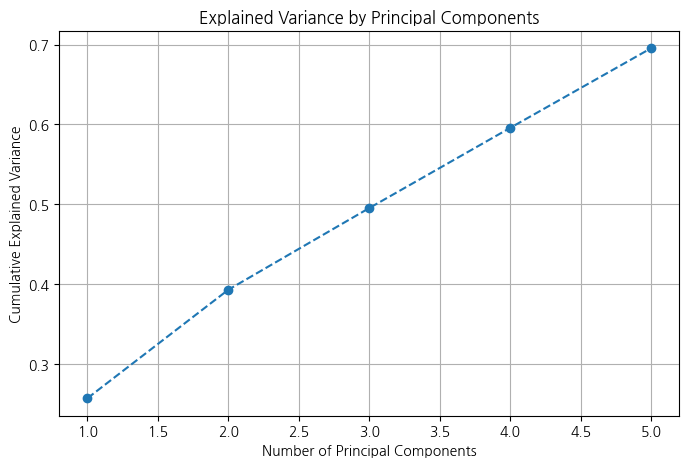

In [30]:
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(explained_variance) + 1), cumulative_explained_variance, marker='o', linestyle='--')
plt.title('Explained Variance by Principal Components')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid()
plt.show()

In [33]:
desired_components =  np.argmax(cumulative_explained_variance >= 0.95) + 1

print(f"Number of components to explain 95% of variance: {desired_components}")

Number of components to explain 95% of variance: 1


In [36]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score
from sklearn.metrics import f1_score, confusion_matrix, precision_recall_curve, roc_curve
from lightgbm import LGBMClassifier

In [37]:
def get_clf_eval(y_test, y_pred=None, pred_proba=None):
    confusion = confusion_matrix(y_test,y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    F1 = f1_score(y_test, y_pred)
    AUC = roc_auc_score(y_test, pred_proba)
    AU2 = roc_auc_score(y_test, y_pred.astype('float32'))
    
    print('\n정확도: {:.4f}'.format(accuracy))
    print('정밀도: {:.4f}'.format(precision))
    print('재현율: {:.4f}'.format(recall))
    print('F1: {:.4f}'.format(F1))
    print('AUC: {:.4f}'.format(AUC))
    print('AUC2 : {:.4f}'.format(AU2))

In [29]:
def objective(params):
    lgbm_clf = LGBMClassifier(
        n_estimators=int(params['n_estimators']),
        num_leaves=int(params['num_leaves']),
        learning_rate=params['learning_rate'],
        min_child_samples=int(params['min_child_samples']),
        subsample=params['subsample'],
        scale_pos_weight = params['scale_pos_weight'],
        max_depth = int(params['max_depth']),
        colsample_bytree = params['colsample_bytree'],
        n_jobs=-1,
        boost_from_average=False,
        metric = 'auc',
        verbose=10
        
    )
    skf = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
    roc_auc_scores = []

    for train_idx, val_idx in skf.split(x_train, y_train):
        X_fold_train, X_fold_val = x_train.iloc[train_idx], x_train.iloc[val_idx]
        y_fold_train, y_fold_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
        
        lgbm_clf.fit(X_fold_train, y_fold_train)
        y_pred_proba = lgbm_clf.predict_proba(X_fold_val)[:, 1]  # 클래스 확률 예측
        roc_auc = roc_auc_score(y_fold_val, y_pred_proba, multi_class='ovo')  # 다중 클래스 지원
        roc_auc_scores.append(roc_auc)
    
    mean_auc = np.mean(roc_auc_scores)
    return {'loss': -mean_auc, 'status': STATUS_OK}

In [30]:
space = {
    'n_estimators': hp.quniform('n_estimators', 30, 5000, 1),
    'num_leaves': hp.quniform('num_leaves', 2, 512, 1),
    'learning_rate': hp.loguniform('learning_rate', np.log(0.01), np.log(0.3)),
    'min_child_samples': hp.quniform('min_child_samples', 5, 50, 1),
    'max_depth' : hp.quniform('max_depth', -1, 256, 1),
    'subsample': hp.uniform('subsample', 0.01, 1.0),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.01, 1.0),
    'scale_pos_weight' : hp.uniform('scale_pos_weight', 1, 15)
}

In [31]:
trials = Trials()
best = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=12, trials=trials, rstate=np.random.default_rng(42))

[LightGBM] [Info] Number of positive: 849035, number of negative: 6053843                                              
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.301488                                           
[LightGBM] [Debug] init for col-wise cost 0.000024 seconds, init for row-wise cost 0.430492 seconds                    
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026617 seconds.             
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Debug] Using Sparse Multi-Val Bin                                                                          
[LightGBM] [Info] Total Bins 739                                                                                       
[LightGBM] [Info] Number of data points in the train set: 6902878, number of used features: 10                         
[LightGBM] [Debug] Trained a tree with

[LightGBM] [Debug] Trained a tree with leaves = 281 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 17                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 258 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 204 and depth = 12                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 4                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 247 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 196 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 211 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 247 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 272 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 26                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 248 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 215 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 321 and depth = 23                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 314 and depth = 26                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 274 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 166 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 278 and depth = 16                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 26                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 27                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 248 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 18                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 203 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 246 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 319 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 250 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 288 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 311 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 210 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 232 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 315 and depth = 15                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 4                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 212 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 4                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 26                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 267 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 26                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 205 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 230 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 159 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 245 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 170 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 305 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 236 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 27                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 247 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 170 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 22                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 27                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 239 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 27                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 200 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 27                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 283 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 312 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 309 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 20                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 191 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 18                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 267 and depth = 16                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 186 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 279 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 237 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 27                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 245 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 315 and depth = 16                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 239 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 153 and depth = 13                                                     
[LightGBM] [Info] Number of positive: 849036, number of negative: 6053843                                              
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.301820                                           
[LightGBM] [Debug] init for col-wise cos

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 195 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 282 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 335 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 206 and depth = 14                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 289 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 371 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 212 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 257 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 274 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 230 and depth = 17                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 4                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 18                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 331 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 186 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 26                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 316 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 188 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 26                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 142 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 27                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 173 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 247 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 22                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 207 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 26                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 265 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 166 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 390 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 166 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 4                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 197 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 212 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 143 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 255 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 308 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 20                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 162 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 308 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 263 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 167 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 27                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 172 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 311 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 4                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 198 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 184 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 136 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 310 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 26                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 348 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 337 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 27                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 161 and depth = 12                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 4                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 234 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 27                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 232 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 246 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 27                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 322 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 160 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 221 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 330 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 245 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 284 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 278 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 27                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 207 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 230 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 228 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 242 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 18                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 27                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 175 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 27                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 313 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 212 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 209 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 311 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 27                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 146 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 311 and depth = 18                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 207 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 212 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 195 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 26                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 195 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 238 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 247 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 26                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 240 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 21                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 27                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 225 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 234 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 238 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 270 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 154 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 172 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 4                                                        
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 232 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 305 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 240 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 193 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 453 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 309 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 242 and depth = 17                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 238 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 253 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 241 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 100 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 110 and depth = 18                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 241 and depth = 16                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 235 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 102 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 251 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Info] Number of data points in the train set: 6902879, number of used features: 10                         
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 106 and depth = 15                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 254 and depth = 16                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 64 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 105 and depth = 16                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 105 and depth = 16                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 253 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 235 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 30                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 31                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Info] Number of positive: 849036, number of negative: 6053843                                              
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.301820                                           
[LightGBM] [Debug] init for col-wise cost 0.000011 seconds, init for row-wise cost 0.474042 seconds                    
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.095114 seconds.             
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Debug] Using Sparse Multi-Val Bin                                                                          
[LightGBM] [Info] Total Bins 733                                                                                       
[LightGBM] [Info] Number of data points in the train set: 6902879, number of used features: 10                         
[LightGBM] [Debug] Trained a tree with

[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 17                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 199 and depth = 12                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 30                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 39                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 36                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 317 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 30                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 33                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 34                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 35                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 38                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 30                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 30                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 38                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 30                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 30                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 52                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 35                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 30                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 30                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 32                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 30                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 30                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 30                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 37                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 40                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 34                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 30                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 32                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 31                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 33                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 31                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 41                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 32                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 39                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 39                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 31                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 30                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 34                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 31                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 34                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 32                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 31                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 34                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 30                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 31                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 34                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 34                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 31                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 35                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 36                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 36                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 34                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 44                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 30                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 31                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 31                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 30                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 33                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 30                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 32                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 30                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 41                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 32                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 34                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 31                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 34                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 32                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 34                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 34                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 32                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 46                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 37                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 32                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 38                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 47                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 34                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 35                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 30                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 35                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 44                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 44                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 31                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 33                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 32                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 33                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 31                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 38                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 39                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 41                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 33                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 30                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 38                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 41                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 35                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 34                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 34                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 48                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 31                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 47                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 39                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 35                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 30                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 30                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 31                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 34                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 33                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 14                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 7                                                       
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 16                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 14                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 14                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 8                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 14                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 14                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 19                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 26                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 18                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 21                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 21                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 8                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 29                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 18                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 20                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 8                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 8                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 21                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 22                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 23                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 14                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 21                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 19                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 20                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 17                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 26                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 18                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 20                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 19                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 8                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 20                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 19                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 16                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 19                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 19                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 16                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 16                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 14                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 14                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 16                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 19                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 23                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 20                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 20                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 20                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 17                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 17                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 23                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 23                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 21                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 14                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 20                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 17                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 14                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 14                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 14                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 14                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 17                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 22                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 20                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 26                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 19                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 18                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 23                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 8                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 24                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 20                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 22                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 14                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 16                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 23                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 8                                                       
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 21                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 19                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 19                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 19                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 19                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 28                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 19                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 23                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 18                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 24                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 19                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 19                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 8                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 19                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 21                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 22                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 19                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 7                                                       
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 7                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 8                                                       
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 17                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 17                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 18                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 19                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 14                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 18                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 22                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 21                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 20                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 21                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 23                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 25                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 18                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 20                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 23                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 25                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 16                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 22                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 19                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 22                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 21                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 14                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 23                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 23                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 22                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 16                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 22                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 18                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 30                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 22                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 21                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 21                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022642 seconds.             
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Debug] Using Sparse Multi-Val Bin                                                                          
[LightGBM] [Info] Total Bins 739                                                                                       
[LightGBM] [Info] Number of data points in the train set: 6902878, number of used features: 10                         
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 20                                                     
[LightGBM] [Warning] No further splits

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 252 and depth = 13                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 282 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 290 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 212 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 4                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 57                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 212 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 195 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 275 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 29                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 212 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 21                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 29                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 194 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 17                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 31                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 30                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 36                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 371 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 22                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 270 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 16                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 243 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 26                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 27                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 357 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 281 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 19                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 361 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 368 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 25                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 23                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 246 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 28                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 267 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 212 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 24                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 228 and depth = 17                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 24                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 4                                                        
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 312 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 26                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 191 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 254 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 18                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 211 and depth = 12                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 31                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 309 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 24                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 213 and depth = 11                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 29                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 252 and depth = 13                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 30                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 18                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 32                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 365 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 229 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 33                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 4                                                        
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 21                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 261 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 271 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 194 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 32                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 361 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 29                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 21                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 246 and depth = 15                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 230 and depth = 15                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 211 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 16                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 3                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 318 and depth = 18                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 25                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 31                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 280 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 250 and depth = 16                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 285 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 24                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 308 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 212 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 256 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 24                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 262 and depth = 17                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 171 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 30                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 245 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 227 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 210 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 30                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 36                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 30                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 191 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 295 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 20                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 298 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 33                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 16                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 24                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 4                                                        
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 47                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 264 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 31                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 37                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 24                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 216 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 31                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 35                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 27                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 28                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 242 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 26                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 31                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 38                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 234 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 26                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 266 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 30                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 22                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 38                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 30                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 27                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 297 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 26                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 209 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 25                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 38                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 30                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 26                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 40                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 340 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 256 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 383 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 19                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 22                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 20                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 19                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 24                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 7                                                       
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 7                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 7                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 19                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 7                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 8                                                       
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 110 and depth = 16                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 110 and depth = 16                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 110 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 18                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 110 and depth = 18                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 16                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 16                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 17                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 110 and depth = 15                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 15                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 14                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 110 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 16                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 16                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 110 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 17                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 110 and depth = 15                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 9                                                       
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 110 and depth = 15                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 110 and depth = 14                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 21                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 110 and depth = 14                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 24                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 25                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 24                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 110 and depth = 14                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 110 and depth = 14                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 110 and depth = 15                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 26                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 23                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 110 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 110 and depth = 20                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 110 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 22                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 110 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 110 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 110 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 11                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 110 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 16                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 17                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 110 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 19                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 18                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 18                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 110 and depth = 17                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 110 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 20                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 18                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 18                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 14                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 17                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 106 and depth = 17                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 14                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 106 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 20                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 17                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 17                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 14                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 107 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 15                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 15                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 107 and depth = 13                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 107 and depth = 14                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 107 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 24                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 21                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 107 and depth = 16                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 19                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 21                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 106 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 21                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 21                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 106 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 25                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 106 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 21                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 106 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 107 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 106 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 106 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 107 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 106 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 17                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 107 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 107 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 20                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 16                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 64 and depth = 13                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 106 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 20                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 64 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 13                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 15                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 16                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 64 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 105 and depth = 16                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 15                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 17                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 105 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 20                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 64 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 105 and depth = 15                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 17                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 64 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 105 and depth = 16                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 105 and depth = 15                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 64 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 105 and depth = 13                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 105 and depth = 14                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 105 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 20                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 105 and depth = 14                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 64 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 105 and depth = 14                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 105 and depth = 14                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 105 and depth = 15                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 105 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 10                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 64 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 105 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 105 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 106 and depth = 18                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 22                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 64 and depth = 9                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 64 and depth = 10                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 64 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 19                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 20                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 105 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 64 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 105 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 64 and depth = 10                                                      
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 105 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 105 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 10                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with leaves = 224 and depth = 17                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 64 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 12                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 13                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 41                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 32                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 12                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 25                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 4 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 4 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 13                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 4                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 126 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 13                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 4 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 118 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 13                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 4 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 13                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 12                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 13                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 12                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 13                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 4                                                       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 122 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 123 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 4 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 4 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 134 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 4 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 120 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 4 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 84 and depth = 15                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 49 and depth = 15                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 46 and depth = 11                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 4                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training be

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training be

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training be

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training be

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training be

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training be

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Info] Number of positive: 849036, number of negative: 6053843                                              
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.301820                                           
[LightGBM] [Debug] init for col-wise cost 0.000031 seconds, init for row-wise cost 0.389729 seconds                    
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.073133 seconds.             
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Debug] Using Sparse Multi-Val Bin                                                                          
[LightGBM] [Info] Total Bins 733                                                                                       
[LightGBM] [Info] Number of data point

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 13                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 13                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 13 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 13                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 19 and depth = 5                                                       
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 124 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 13                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 111 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 13                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 12                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 99 and depth = 20                                                      
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 12                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 13                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 129 and depth = 13                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 4 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 4 and depth = 2                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 4 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 35 and depth = 13                                                      
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 107 and depth = 18                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 2 and depth = 1                                                        
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training be

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training be

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training be

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training be

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training be

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training be

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training be

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training be

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training be

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training be

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training be

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training be

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training be

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training be

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training be

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training be

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training be

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training be

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training be

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training be

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training be

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training be

[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 1 and depth = 1                                                        
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements                
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 17 and depth = 5                                                       
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 13                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 5                                                       
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 17 and depth = 5                                                       
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 31                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 13                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 4 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 102 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 4 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 4 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 13                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 88 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 32                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 4                                                       
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 103 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 3                                                        
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 13                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 25                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 12                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 13                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 120 and depth = 26                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 87 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 4 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 124 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 4 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 27                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 12                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 13                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 12                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 13                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 23                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 4 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 22                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 4 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 23                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 13                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 4 and depth = 2                                                        
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 14                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 17                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 24                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 18                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 19                                                     
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                             
[LightGBM] [Debug] Trained a tree with leaves = 116 and depth = 20                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 15                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 21                                                     
[LightGBM] [Debug] Trained a tree with leaves = 139 and depth = 16                                                     
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 20                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 20                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 24                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 20                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 19                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 26                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 20                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 19                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 19                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 19                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 21                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 19                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 19                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 20                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 20                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 20                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 23                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 19                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 19                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13                                                      
[LightGBM] [Info] Number of positive: 849036, number of negative: 6053843                                              
[LightGBM] [Debug] Dataset::GetMultiBinF

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 21                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 10                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 23                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 9                                                       
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 20                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 19                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 23                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 21                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 21                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 21                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 21                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 24                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 21                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 20                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 21                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 22                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 20                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 19                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 19                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 19                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 23                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 21                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 21                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 19                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 22                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 19                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 22                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 22                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 22                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 19                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 17                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 19                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 18                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 21                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 16                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 11                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 12                                                      
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13                                                      
[LightGBM] [Debug] Trained a tree with l

In [32]:
print("Best parameters found: ", best)

Best parameters found:  {'colsample_bytree': 0.5876962864223697, 'learning_rate': 0.020146521712146016, 'max_depth': 128.0, 'min_child_samples': 8.0, 'n_estimators': 3531.0, 'num_leaves': 304.0, 'scale_pos_weight': 3.971039637906693, 'subsample': 0.4097398935593594}


In [39]:
best_params = {
    'n_estimators': int(best['n_estimators']),
    'scale_pos_weight' : best['scale_pos_weight'],
    'num_leaves': int(best['num_leaves']),
    'learning_rate': best['learning_rate'],
    'min_child_samples': int(best['min_child_samples']),
    'subsample': best['subsample'],
    'max_depth' : int(best['max_depth']),
    'colsample_bytree': best['colsample_bytree'],
    'n_jobs': -1,
    'boost_from_average': False,
    'verbose': 10
}


NameError: name 'best' is not defined

In [40]:
best_params = {
    'n_estimators': int(3531.0),
    'scale_pos_weight' : 3.971039637906693,
    'num_leaves': int(304.0),
    'learning_rate':0.020146521712146016,
    'min_child_samples': int(8.0),
    'subsample': 0.4097398935593594,
    'max_depth' : int(128.0),
    'colsample_bytree': 0.5876962864223697,
    'n_jobs': -1,
    'boost_from_average': False,
    'verbose': 10
}


In [41]:
best_lgbm_clf = LGBMClassifier(**best_params)
best_lgbm_clf.fit(x_train_pca, y_train)

[LightGBM] [Info] Number of positive: 1273553, number of negative: 9080765
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.000000
[LightGBM] [Debug] init for col-wise cost 0.000287 seconds, init for row-wise cost 0.071394 seconds
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.100364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 10354318, number of used features: 5
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 14
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 15
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 15
[LightGBM] [Debug] Trained a tree with leaves = 304 

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 17
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 17
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 17
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 15
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 16
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 17
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 16
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth 

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth 

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth 

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth 

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 29
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth 

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 30
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 29
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 17
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 29
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth 

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 35
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth 

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 29
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 29
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 17
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth 

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth 

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 30
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth 

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 29
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 29
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth 

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth 

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 31
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth 

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 35
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth 

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth 

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth 

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 16
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 16
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth 

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth 

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth 

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth 

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth 

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth 

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 27
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth 

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 33
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 32
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth 

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 29
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 30
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth 

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 30
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth 

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 26
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 30
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth 

[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 28
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 30
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 23
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 18
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 22
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 32
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 25
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 24
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth = 21
[LightGBM] [Debug] Trained a tree with leaves = 304 and depth 

LGBMClassifier(boost_from_average=False, colsample_bytree=0.5876962864223697,
               learning_rate=0.020146521712146016, max_depth=128,
               min_child_samples=8, n_estimators=3531, num_leaves=304,
               scale_pos_weight=3.971039637906693, subsample=0.4097398935593594,
               verbose=10)

In [42]:
pred = best_lgbm_clf.predict(x_val_pca)
pred_proba = best_lgbm_clf.predict_proba(x_val_pca)[:,1]
get_clf_eval(y_val,pred,pred_proba)


정확도: 0.7448
정밀도: 0.3047
재현율: 0.8384
F1: 0.4469
AUC: 0.8522
AUC2 : 0.7850


In [ ]:
a=best_lgbm_clf.predict_proba(target_pca)[:,1]

In [ ]:
submit = pd.read_csv("./playground-series-s4e7/sample_submission.csv")
pred = a 
submit["Response"] = pred
submit.to_csv("submission_LGBM_optimization_pca.csv", index=False)
submit.head()